<style>
    h1 {
        font-family: "Times New Roman", Times, serif; /* Use a serif font for headings */
        font-size: 24px; /* Increase font size for headings */
        font-weight: bold; /* Make headings bold */
    }

    h3 {
        font-family: "Times New Roman", Times, serif; /* Use a serif font for subheadings */
        font-size: 20px; /* Increase font size for subheadings */
        font-weight: bold; /* Make subheadings bold */
    }

    p {
        font-family: "Times New Roman", Times, serif; /* Use a serif font for paragraph text */
        font-size: 16px; /* Set a standard font size */
        line-height: 1.6; /* Increase line height for better readability */
    }
</style>

<h1>Home Work-1 Computing Q5</h1>


<p>First, we will perform the required imports.</p>

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import convolve2d


<p>Present Image.</p>

In [ ]:
def present_image(img, title, xlabel = '', ylabel = ''):
  # convert each of the RGB chnnels to the correct dynamic range:
  img = (((img-np.min(img))/np.max(img))* 255).astype(int);
  # Plot:
  plt.figure(figsize=(16,8));
  plt.imshow(img, cmap="gray");
  plt.title(title);
  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.show();
  

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <meta name="viewport" content="width=device-width, initial-scale=1.0">
  <title>MathML Example</title>
    <p style="center">Edge Sharpening Kernel</p>
</head>
<body>
  <math xmlns="http://www.w3.org/1998/Math/MathML" display="block">
    <mi>∆</mi>
    <mo>-</mo>
    <mi>a</mi>
    <mo>×</mo>
    <msup>
      <mo>∇</mo>
      <mn>2</mn>
    </msup>
  </math>

</body>
</html>


In [ ]:
laplcian = np.array([
                  [0,1,0],
                  [1,-4,1],
                  [0,1,0]
                  ])

delta = np.array([ 
                  [0,0,0],
                  [0,1,0],
                  [0,0,0]
                  ])
a = 10

kernel_edge_sharpen = delta - a * laplcian

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <meta name="viewport" content="width=device-width, initial-scale=1.0">
  <title>Scientific Text</title>
</head>
<body>
  <p>Let's plot out image.</p>
</body>
</html>


In [ ]:

I1 = cv2.imread('./imgs/Inigo.jpg', cv2.IMREAD_GRAYSCALE)
present_image(I1,"Inigo.jpg")


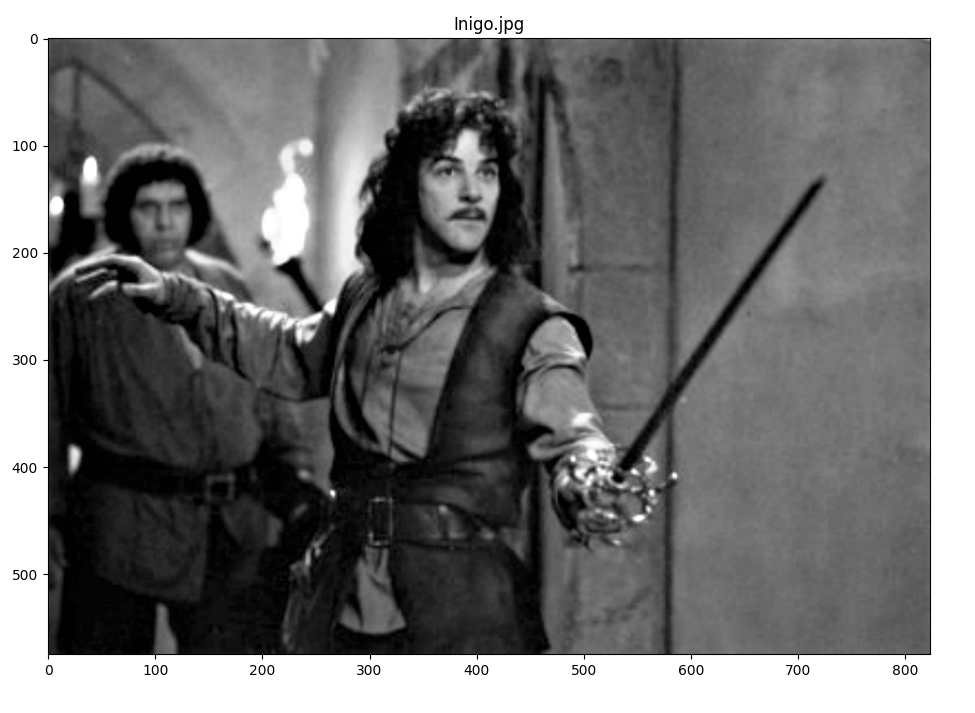

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Convolution and Clipping</title>
</head>
<body>
  <h1>Convolution and Clipping</h1>
  <p>Convolve input image with kernel, then clip pixel values within range.</p>
</body>
</html>


In [ ]:

def convolve_clip(Img, kernel, min_val, max_val):
  convolved_image = convolve2d(Img, kernel, mode='same')  # Perform 2D convolution
  # Clip the values
  clipped_data = np.clip(convolved_image, min_val, max_val)
  return clipped_data


# Define the clipping range
min_val = 0
max_val = 255

for index, value in enumerate(a):
  kernel_edge_sharpen = delta - value * laplcian
  plt.subplot(4, 2, index+1)
  plt.imshow(convolve_clip(I1,kernel_edge_sharpen,min_val,max_val), cmap="gray")


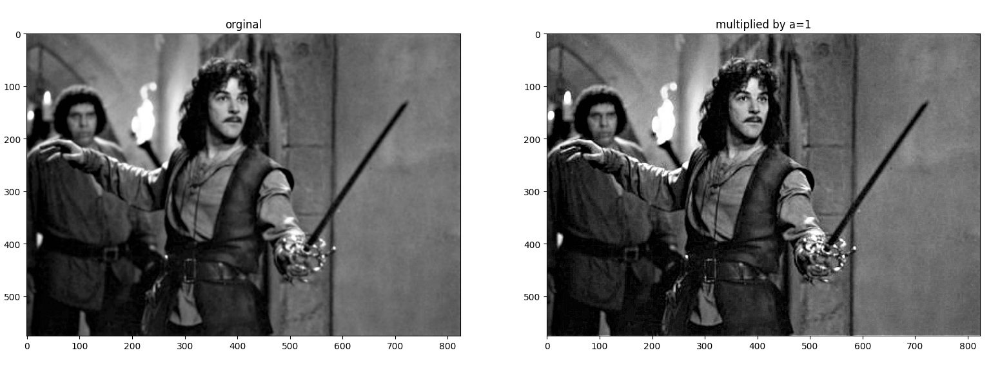

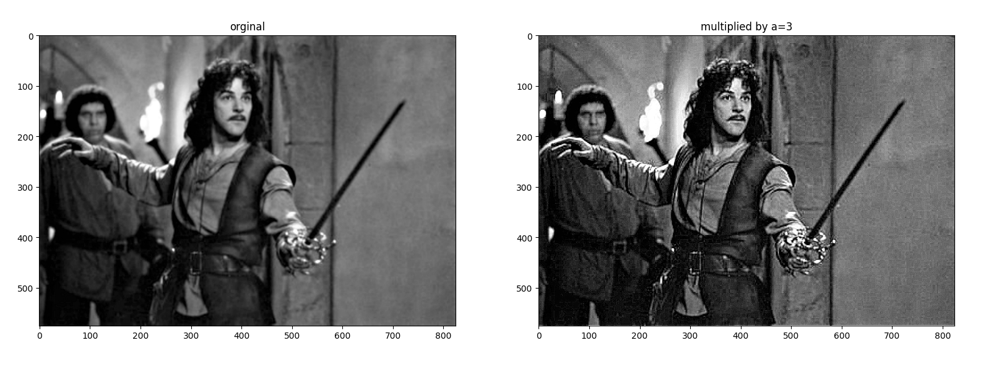

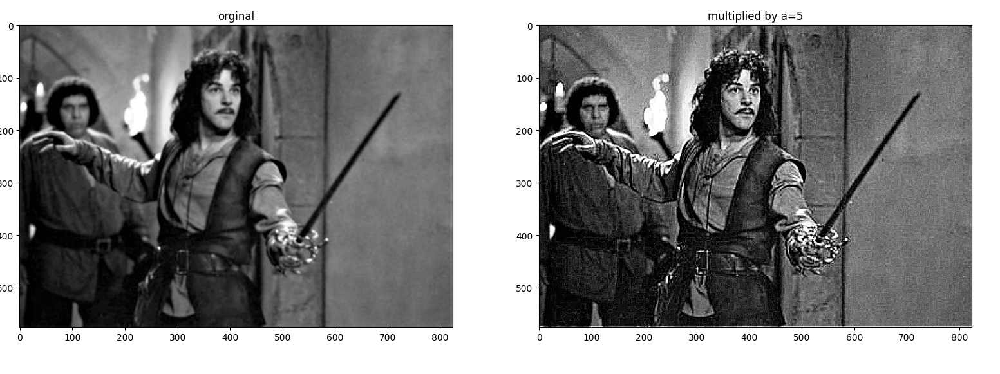

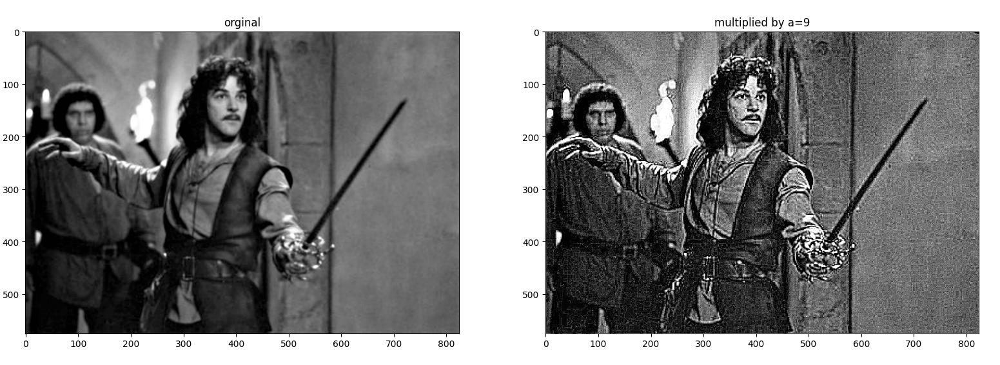

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
</head>
<body>
  <p>If <i>a</i> is in the group {1..10}, then the ideal value of <i>a</i> is between 1 and 3 (inclusive).</p>

  <p>Undesirables<i> result when alpha is high, we start to get something similar to speckle noise</p>
</body>
</html>


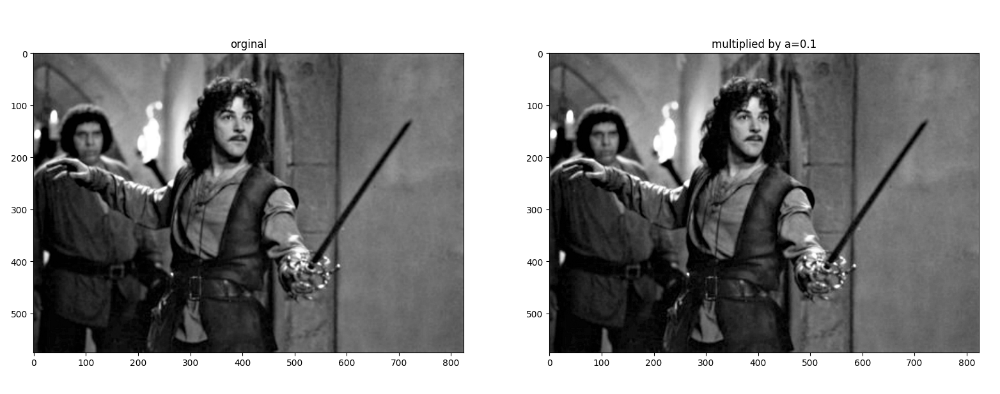

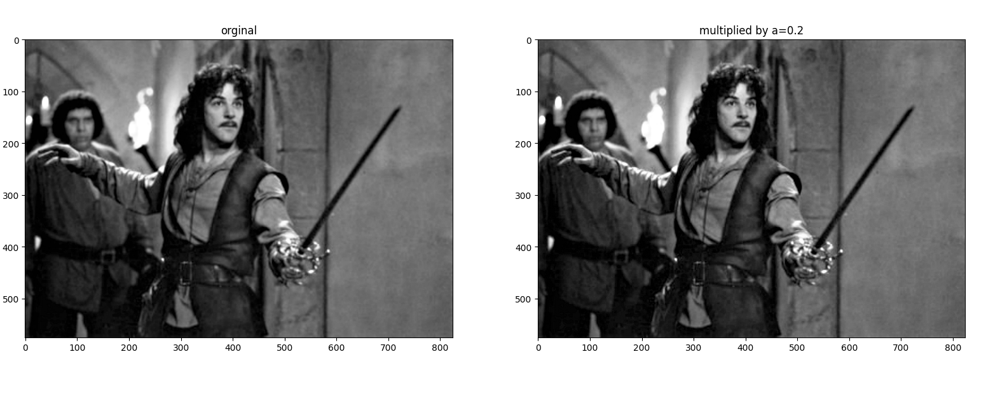

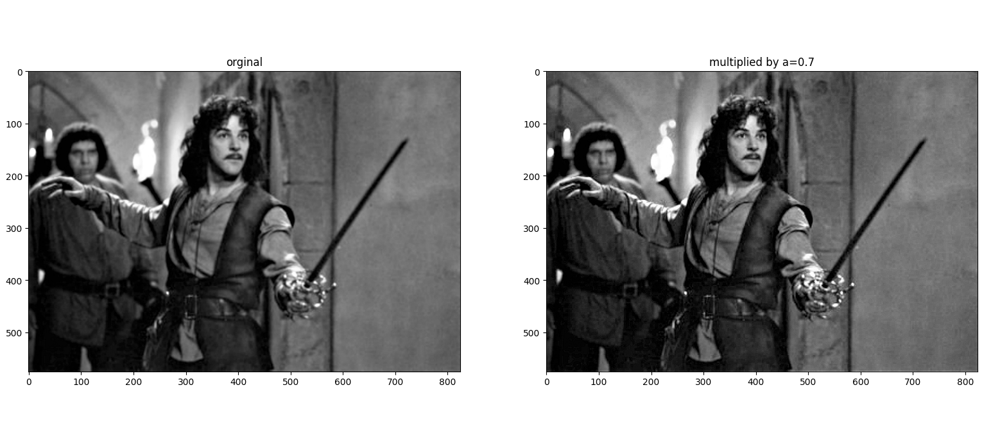

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
</head>
<body>
  <p>If <i>a</i> is in the group {01,02..1}, then image almost didn't change till a = 1</p>
</body>
</html>


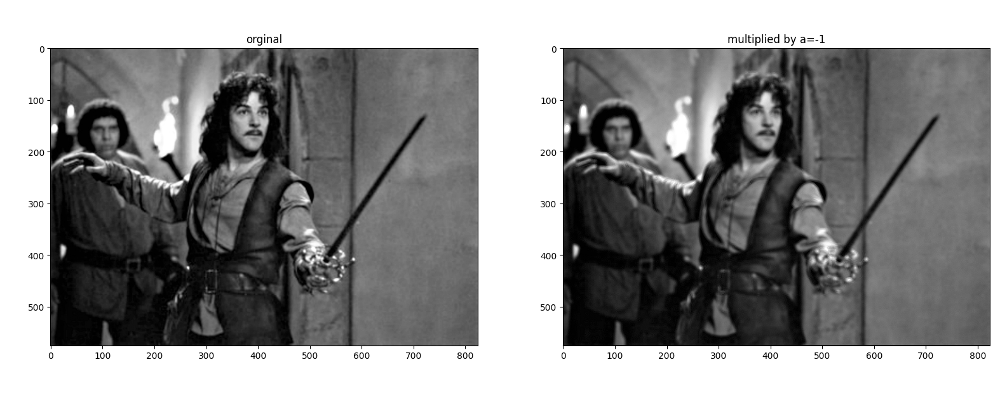

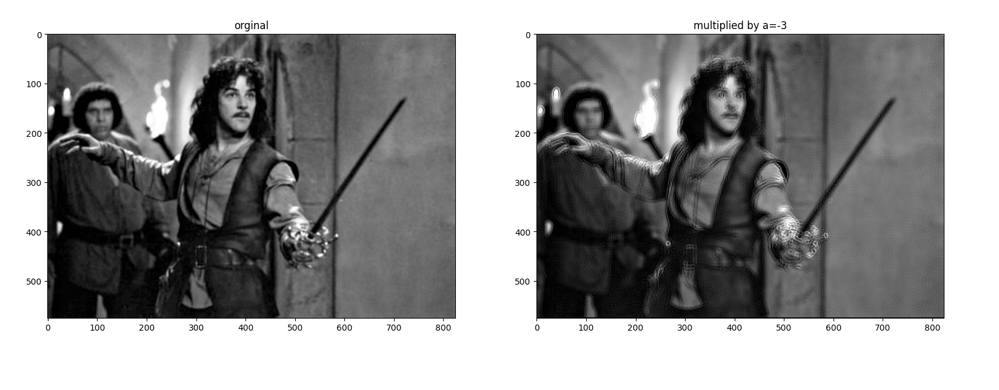

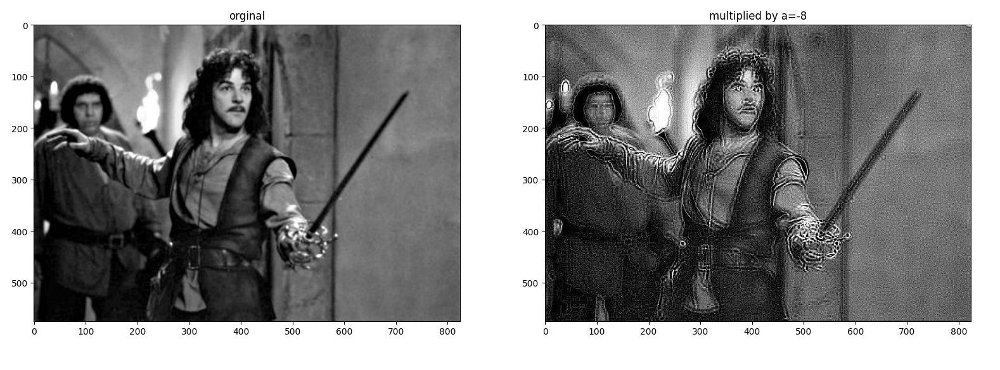

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
</head>
<body>
  <p>If <i>a</i> is in the group {-1, -2...-10}, then image is getting more blurry</p>
</body>
</html>


<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Sharpening Filter Description</title>
</head>
<body>
  <h1>Sharpening Filter Description</h1>
  <p>This filter multiplies the four neighbors of the central pixel by <i>-alpha</i>, while multiplying the central pixel by <i>(1 + 4*alpha)</i>.</p>
  <p><i>Alpha</i> is used to determine the sharpening scale (gain).</p>

  <p><i>When</i> alpha is negative, the image getting more blurry</p>

  <p><i>Alpha</i> determine either the filter is a high pass filter or low pass filter if alpha is zero
  then we convolving with delta, we will do nothing</p>
</body>
</html>


<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Sharpening Filter Description</title>
</head>
<body>
  <h3>Obtain an image with 'salt and pepper' noise</h3>

</body>
</html>


In [ ]:

def salt_and_pepper_noise(image, salt_prob, pepper_prob):
    """
    Add salt and pepper noise to an image.
    
    Parameters:
        image: numpy.ndarray
            Input image.
        salt_prob: float
            Probability of adding salt noise (range: 0 to 1).
        pepper_prob: float
            Probability of adding pepper noise (range: 0 to 1).
    
    Returns:
        numpy.ndarray
            Image with salt and pepper noise.
    """
    noisy_image = np.copy(image)
    salt_mask = np.random.rand(*image.shape) < salt_prob
    pepper_mask = np.random.rand(*image.shape) < pepper_prob
    noisy_image[salt_mask] = 255
    noisy_image[pepper_mask] = 0
    return noisy_image





# Add salt and pepper noise with probability of 0.1 for salt and pepper
noisy_image = salt_and_pepper_noise(I1, 0.1, 0.1)

a = (0.2, 0.7)
kernel_edge_sharpen = delta - a[0] * laplcian

plt.figure(figsize=(16,8));
plt.subplot(1, 3, 1)
plt.title("orginal")
plt.imshow(I1, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(convolve_clip(noisy_image,kernel_edge_sharpen,min_val,max_val), cmap="gray")
plt.title(f"noisy multiplied by a={a[0]}")

kernel_edge_sharpen = delta - a[1] * laplcian
plt.subplot(1, 3, 3)
plt.imshow(convolve_clip(noisy_image,kernel_edge_sharpen,min_val,max_val), cmap="gray")
plt.title(f"noisy multiplied by a={a[1]}")
plt.show()

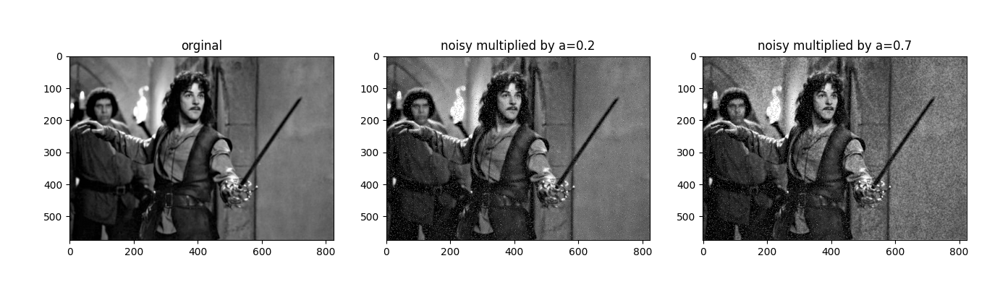

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Sharpening Filter Description</title>
</head>
<body>
  <h1>Conclusion</h1>

  <p><i>When Alpha is 1 we can see clearly the effect of salt </i> 
</body>
</html>

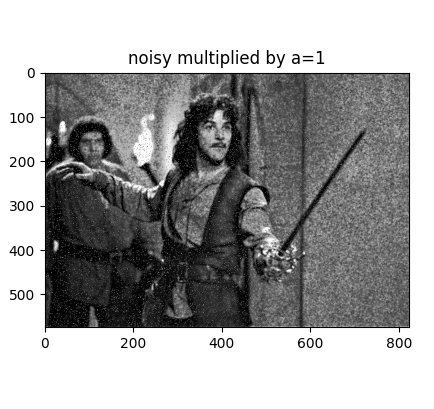

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Sharpening Filter Description</title>
</head>
<body>
  <h1>Conclusion</h1>
  <p><i>When Alpha equals 1, we can clearly observe the effect of salt and pepper noise.</i></p>
  <p><i>So, if alpha is set to 1, our filter is defined as δ - α * H_L. The convolution of f with δ - α * H_L is equivalent to f - α * convolution(f, H_L). This creates a low-pass filter. Low-pass filters are sensitive to changes, which means that setting alpha to 0.2 will make the filter less sensitive, while setting it to 0.7 will make it more sensitive. The resulting effect can be observed in the picture.</i></p>
</body>
</html>

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Sharpening Filter Description</title>
</head>
<body>
  <h1>Lets fix the salt & paper noise</h1>
</body>
</html>

In [ ]:
a = (0.2, 0.7)
kernel_edge_sharpen = delta - a[0] * laplcian

plt.subplot(2, 2, 1)
noisy1 = convolve_clip(noisy_image,kernel_edge_sharpen,min_val,max_val)
plt.imshow(noisy1, cmap="gray")
plt.title(f"noisy multiplied by a={a[0]}")


# 2*2 relatively to 4% S&P noise is 2*2 
# Apply median filtering with a kernel size of 3x3
filtered_image1 = cv2.medianBlur(noisy1.astype(np.uint8), 3)
plt.subplot(2, 2, 2)
plt.imshow(filtered_image1, cmap="gray")
plt.title(f"after median filter 2*2")




kernel_edge_sharpen = delta - a[1] * laplcian
plt.subplot(2, 2, 3)
noisy2= convolve_clip(noisy_image,kernel_edge_sharpen,min_val,max_val)
plt.imshow(noisy2, cmap="gray")
plt.title(f"noisy multiplied by a={a[1]}")


# 2*2 relatively to 4% S&P noise is 2*2 
# Apply median filtering with a kernel size of 3x3
filtered_image2 = cv2.medianBlur(noisy2.astype(np.uint8), 3)
plt.subplot(2, 2, 4)
plt.imshow(filtered_image2, cmap="gray")
plt.title(f"after median filter 2*2")





plt.show()

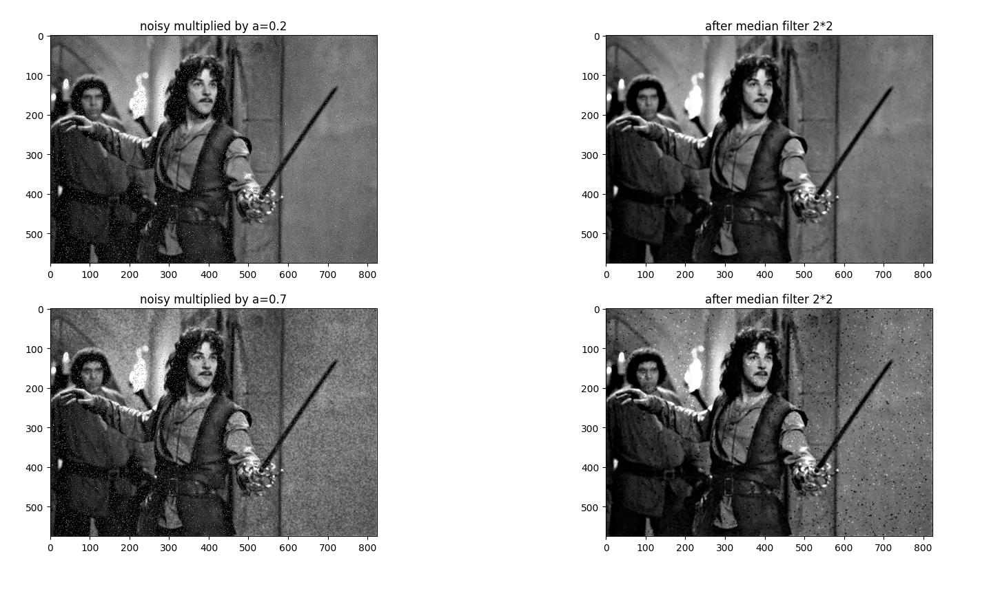

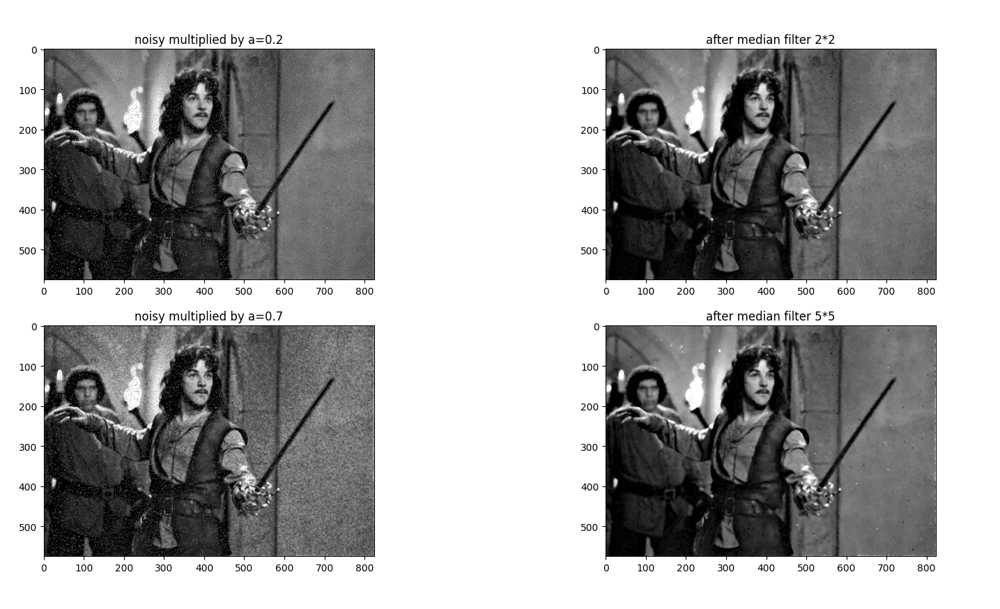

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Lets do the same with shot noise</title>
</head>
<body>
  <h1>Lets do the same with shot noise</h1>
</body>
</html>

In [ ]:


a = (0.2, 0.7)
kernel_edge_sharpen1 = delta - a[0] * laplcian
kernel_edge_sharpen2 = delta - a[1] * laplcian


# Generate shot noise
gamma = 300
shot_noise = np.random.poisson(gamma, size=I1.shape)
plt.subplot(1, 2, 1)
plt.title("orginal")
plt.imshow(I1, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(I1+shot_noise, cmap="gray")
plt.title(f"shot noise with gamma={gamma}")

plt.show()

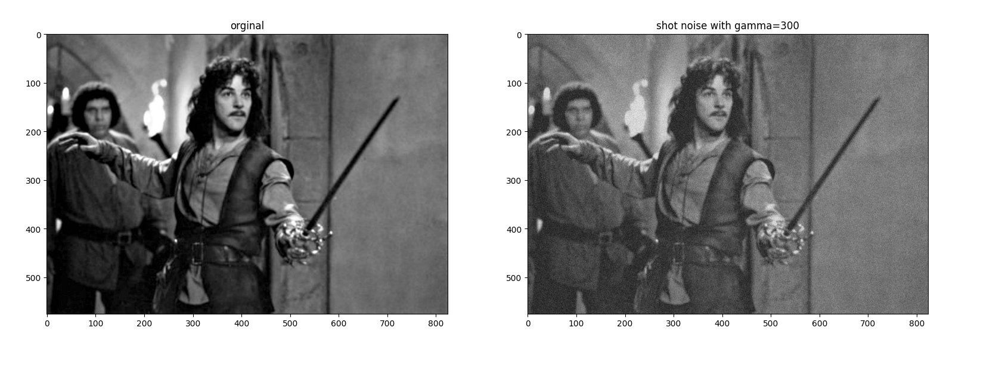

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Lets do the same with shot noise</title>
</head>
<body>
  <h1>After median filter</h1>
  <p>the image has totally corrupted</p>
</body>
</html>

In [ ]:
a = (0.2, 0.7)
kernel_edge_sharpen1 = delta - a[0] * laplcian
kernel_edge_sharpen2 = delta - a[1] * laplcian


# Generate shot noise
gamma = 300
shot_noise = np.random.poisson(gamma, size=I1.shape)
plt.subplot(1, 3, 1)
plt.title("orginal")
plt.imshow(I1, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(I1+shot_noise, cmap="gray")
plt.title(f"shot noise with gamma={gamma}")

noisy = I1+shot_noise
 
# Apply median filtering with a kernel size of 3x3
filtered_image1 = cv2.medianBlur(noisy.astype(np.uint8), 3)
plt.subplot(1, 3, 3)
plt.imshow(filtered_image1, cmap="gray")
plt.title(f"after median filter={gamma}")
plt.show()


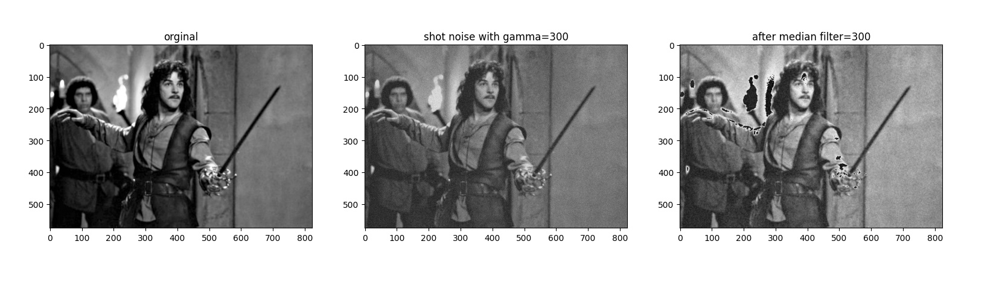

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Lets do the same with shot noise</title>
</head>
<body>
  <h1>Explanation</h1>
  <p><i>The median filter is good for noise with high amplitude but with small spatial support</i></p>
    <p><i>noise the have small spatial support means, that the noise effect some pixel in a given spatial "Support" pixel and not must of them</i></p>
</body>
</html>

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Lets do the same with shot noise</title>
</head>
<body>
  <h1>The differences between Poisson noise and Gaussian noise</h1>
     <p><i>The distinction between Poisson noise and Gaussian noise lies in their statistical properties. Gaussian noise is characterized by being independent and identically distributed (IID), meaning each sample is drawn independently from the same distribution. In contrast, Poisson noise does not adhere to the IID property.

Poisson noise is contingent upon the pixel's luminance level. For instance, in regions of high brightness where more photons are detected by the sensor, the magnitude of Poisson noise tends to be higher. Conversely, in darker areas, where fewer photons reach the sensor, the likelihood of noise affecting the pixel diminishes. Consequently, pixels exposed to a greater influx of photons exhibit a higher probability of being subject to noise compared to those in low-light conditions.
</i></p>

<p><i>Gaussian noise uniformly affects all pixels in an image. In Gaussian noise, each pixel is subjected to the same distribution. For example, if the mean of the Gaussian noise is 4, then a value of 4 will be added to every pixel in the photograph.
</i></p>

</body>
</html>